In [1]:
#作業
#請參考投影片P20~P25法則觀察資料、處理資料

#例如:
#移除一些不必要資料
#資料進行標準化
#資料視覺化
#選擇K群

#分群完成後，針對每一群的病人
#觀查這些變數(透過平均值、中位數...敘述型統計)，給予該群一個名稱定義 (例如: 高血酯症候群等)
#並且對於該群給予醫療上的建議與衛教方式

#提示: 也可以參考該群內的腎臟病患者比例 (Yes/No)，
#這表示分群時，Chronic Kidney Disease: yes 該欄位並未引入，最後得到群的病人時，才引入

#最後，請透過文字圖表來表示，每群的特徵

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

In [3]:
data=pd.read_csv("kidney_disease.csv")

In [4]:
print("資料筆數:",len(data))
print("欄位數量",len(data.columns))

資料筆數: 400
欄位數量 25


In [5]:
data.head()

,Age (yrs),Blood Pressure (mm/Hg),Specific Gravity,Albumin,Sugar,Blood Glucose Random (mgs/dL),Blood Urea (mgs/dL),Serum Creatinine (mgs/dL),Sodium (mEq/L),Potassium (mEq/L),...,Pus Cells: normal,Pus Cell Clumps: present,Bacteria: present,Hypertension: yes,Diabetes Mellitus: yes,Coronary Artery Disease: yes,Appetite: poor,Pedal Edema: yes,Anemia: yes,Chronic Kidney Disease: yes
0,48.0,80,1.020,1.0,0,121.000000,36.0,1.2,136.0,4.7,...,1,0,0,1,1,0,0,0,0,1
1,7.0,50,1.020,4.0,0,90.316581,18.0,0.8,140.0,4.0,...,1,0,0,0,0,0,0,0,0,1
2,62.0,80,1.010,2.0,3,423.000000,53.0,1.8,135.0,4.8,...,1,0,0,0,1,0,1,0,1,1
3,48.0,70,1.005,4.0,0,117.000000,56.0,3.8,111.0,2.5,...,0,1,0,1,0,0,1,1,1,1
4,51.0,80,1.010,2.0,0,106.000000,26.0,1.4,140.0,4.0,...,1,0,0,0,0,0,0,0,0,1


In [6]:
# 查看資料欄位類型
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Age (yrs)                       400 non-null    float64
 1   Blood Pressure (mm/Hg)          400 non-null    int64  
 2   Specific Gravity                400 non-null    float64
 3   Albumin                         400 non-null    float64
 4   Sugar                           400 non-null    int64  
 5   Blood Glucose Random (mgs/dL)   400 non-null    float64
 6   Blood Urea (mgs/dL)             400 non-null    float64
 7   Serum Creatinine (mgs/dL)       400 non-null    float64
 8   Sodium (mEq/L)                  400 non-null    float64
 9   Potassium (mEq/L)               400 non-null    float64
 10  Hemoglobin (gms)                400 non-null    float64
 11  Packed Cell Volume              400 non-null    float64
 12  White Blood Cells (cells/cmm)   400 

# 資料預處理

In [7]:
data["Red Blood Cells: normal"]=data["Red Blood Cells: normal"].astype("category")
data["Pus Cells: normal"]=data["Pus Cells: normal"].astype("category")
data["Pus Cell Clumps: present"]=data["Pus Cell Clumps: present"].astype("category")
data["Bacteria: present"]=data["Bacteria: present"].astype("category")
data["Hypertension: yes"]=data["Hypertension: yes"].astype("category")
data["Diabetes Mellitus: yes"]=data["Diabetes Mellitus: yes"].astype("category")
data["Coronary Artery Disease: yes"]=data["Coronary Artery Disease: yes"].astype("category")
data["Appetite: poor"]=data["Appetite: poor"].astype("category")
data["Pedal Edema: yes"]=data["Pedal Edema: yes"].astype("category")
data["Anemia: yes"]=data["Anemia: yes"].astype("category")
data["Chronic Kidney Disease: yes"]=data["Chronic Kidney Disease: yes"].astype("category")

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   Age (yrs)                       400 non-null    float64 
 1   Blood Pressure (mm/Hg)          400 non-null    int64   
 2   Specific Gravity                400 non-null    float64 
 3   Albumin                         400 non-null    float64 
 4   Sugar                           400 non-null    int64   
 5   Blood Glucose Random (mgs/dL)   400 non-null    float64 
 6   Blood Urea (mgs/dL)             400 non-null    float64 
 7   Serum Creatinine (mgs/dL)       400 non-null    float64 
 8   Sodium (mEq/L)                  400 non-null    float64 
 9   Potassium (mEq/L)               400 non-null    float64 
 10  Hemoglobin (gms)                400 non-null    float64 
 11  Packed Cell Volume              400 non-null    float64 
 12  White Blood Cells (cel

In [9]:
data["Red Blood Cells: normal"] = data["Red Blood Cells: normal"].cat.rename_categories(['No','Yes'])
data["Pus Cells: normal"] = data["Pus Cells: normal"].cat.rename_categories(['No','Yes'])
data["Pus Cell Clumps: present"] = data["Pus Cell Clumps: present"].cat.rename_categories(['No','Yes'])
data["Bacteria: present"] = data["Bacteria: present"].cat.rename_categories(['No','Yes'])
data["Hypertension: yes"] = data["Hypertension: yes"].cat.rename_categories(['No','Yes'])
data["Diabetes Mellitus: yes"] = data["Diabetes Mellitus: yes"].cat.rename_categories(['No','Yes'])
data["Coronary Artery Disease: yes"] = data["Coronary Artery Disease: yes"].cat.rename_categories(['No','Yes'])
data["Appetite: poor"] = data["Appetite: poor"].cat.rename_categories(['No','Yes'])
data["Pedal Edema: yes"] = data["Pedal Edema: yes"].cat.rename_categories(['No','Yes'])
data["Anemia: yes"] = data["Anemia: yes"].cat.rename_categories(['No','Yes'])
data["Chronic Kidney Disease: yes"] = data["Chronic Kidney Disease: yes"].cat.rename_categories(['No','Yes'])

In [10]:
data.head()

,Age (yrs),Blood Pressure (mm/Hg),Specific Gravity,Albumin,Sugar,Blood Glucose Random (mgs/dL),Blood Urea (mgs/dL),Serum Creatinine (mgs/dL),Sodium (mEq/L),Potassium (mEq/L),...,Pus Cells: normal,Pus Cell Clumps: present,Bacteria: present,Hypertension: yes,Diabetes Mellitus: yes,Coronary Artery Disease: yes,Appetite: poor,Pedal Edema: yes,Anemia: yes,Chronic Kidney Disease: yes
0,48.0,80,1.020,1.0,0,121.000000,36.0,1.2,136.0,4.7,...,Yes,No,No,Yes,Yes,No,No,No,No,Yes
1,7.0,50,1.020,4.0,0,90.316581,18.0,0.8,140.0,4.0,...,Yes,No,No,No,No,No,No,No,No,Yes
2,62.0,80,1.010,2.0,3,423.000000,53.0,1.8,135.0,4.8,...,Yes,No,No,No,Yes,No,Yes,No,Yes,Yes
3,48.0,70,1.005,4.0,0,117.000000,56.0,3.8,111.0,2.5,...,No,Yes,No,Yes,No,No,Yes,Yes,Yes,Yes
4,51.0,80,1.010,2.0,0,106.000000,26.0,1.4,140.0,4.0,...,Yes,No,No,No,No,No,No,No,No,Yes


In [11]:
numeric=['Age (yrs)','Blood Glucose Random (mgs/dL)','Blood Urea (mgs/dL)','Serum Creatinine (mgs/dL)','Sodium (mEq/L)','Potassium (mEq/L)','Hemoglobin (gms)','Packed Cell Volume','White Blood Cells (cells/cmm)','Red Blood Cells (millions/cmm)']

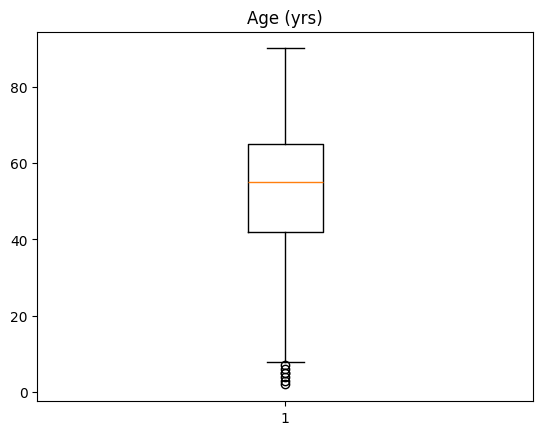

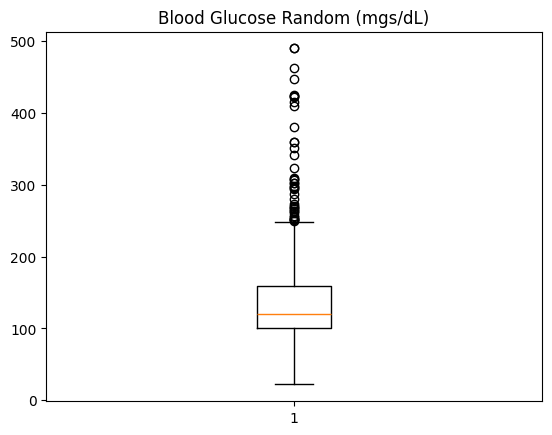

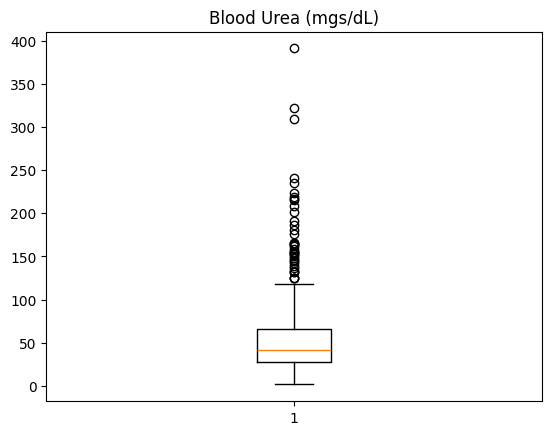

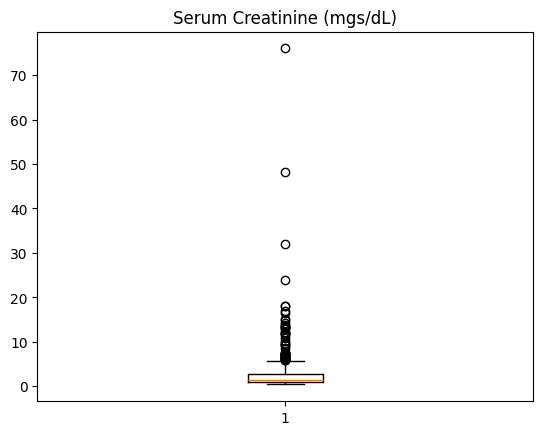

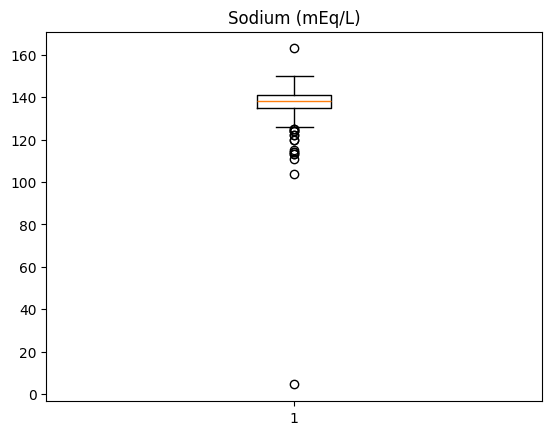

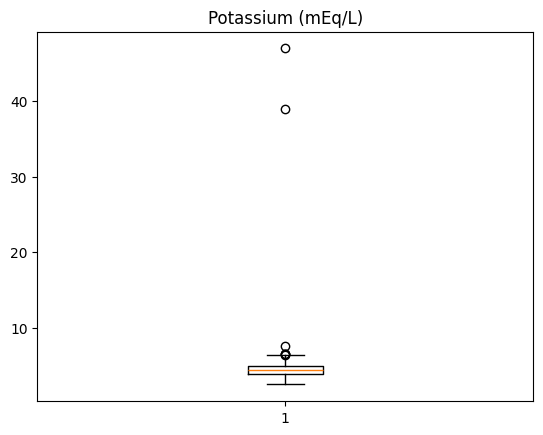

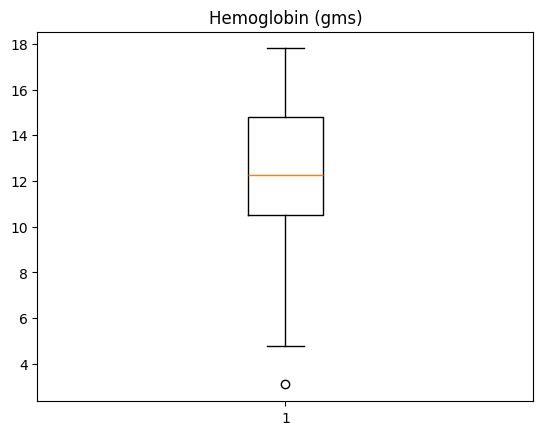

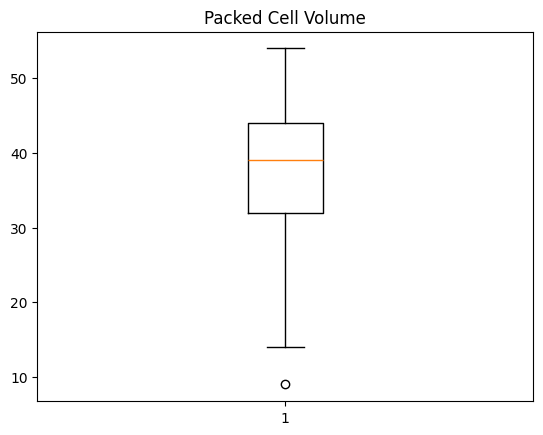

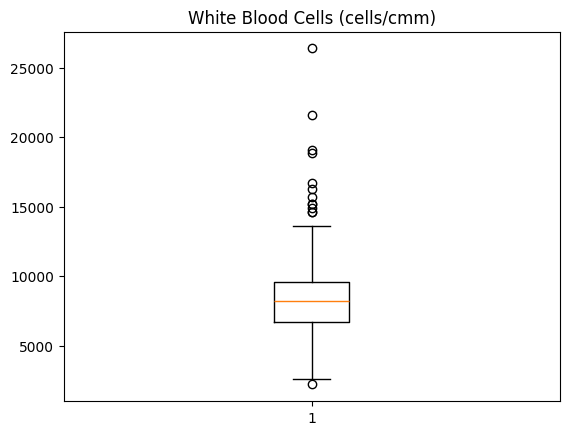

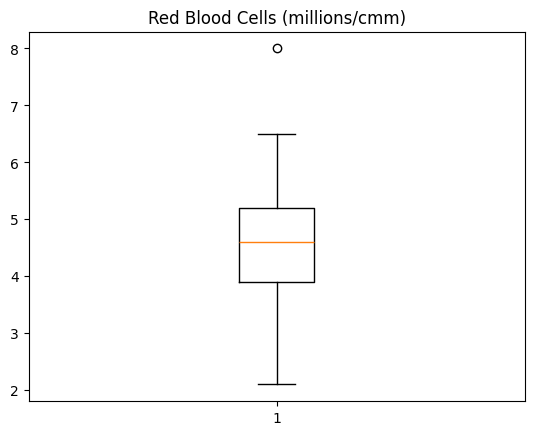

In [12]:
#一覽表視覺化，繪製 (5x2) 的圖表
#數值型欄位

#5x2的圖表
for index, column in enumerate(numeric):
    plt.title(column)
    plt.boxplot(data[column])
    plt.show()

In [13]:
# numeric=['Age (yrs)','Blood Pressure (mm/Hg)','Specific Gravity','Albumin','Sugar','Blood Glucose Random (mgs/dL)','Blood Urea (mgs/dL)','Serum Creatinine (mgs/dL)','Sodium (mEq/L)','Potassium (mEq/L)','Hemoglobin (gms)','Packed Cell Volume','White Blood Cells (cells/cmm)','Red Blood Cells (millions/cmm)']
data = data[data['Blood Urea (mgs/dL)']<300]
data = data[data['Serum Creatinine (mgs/dL)']<40]
data = data[data['Sodium (mEq/L)']>80]
data = data[data['Potassium (mEq/L)']<30]
data = data[data['White Blood Cells (cells/cmm)']<20000]
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 392 entries, 0 to 399
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   Age (yrs)                       392 non-null    float64 
 1   Blood Pressure (mm/Hg)          392 non-null    int64   
 2   Specific Gravity                392 non-null    float64 
 3   Albumin                         392 non-null    float64 
 4   Sugar                           392 non-null    int64   
 5   Blood Glucose Random (mgs/dL)   392 non-null    float64 
 6   Blood Urea (mgs/dL)             392 non-null    float64 
 7   Serum Creatinine (mgs/dL)       392 non-null    float64 
 8   Sodium (mEq/L)                  392 non-null    float64 
 9   Potassium (mEq/L)               392 non-null    float64 
 10  Hemoglobin (gms)                392 non-null    float64 
 11  Packed Cell Volume              392 non-null    float64 
 12  White Blood Cells (cells/cm

C:\Users\user\AppData\Local\Temp\ipykernel_18700\4144876758.py:26: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  fig=sns.distplot(data[column], color="g", label=collabel, norm_hist=True,
C:\Users\user\AppData\Local\Temp\ipykernel_18700\4144876758.py:26: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  fig=sns.distplot(data[

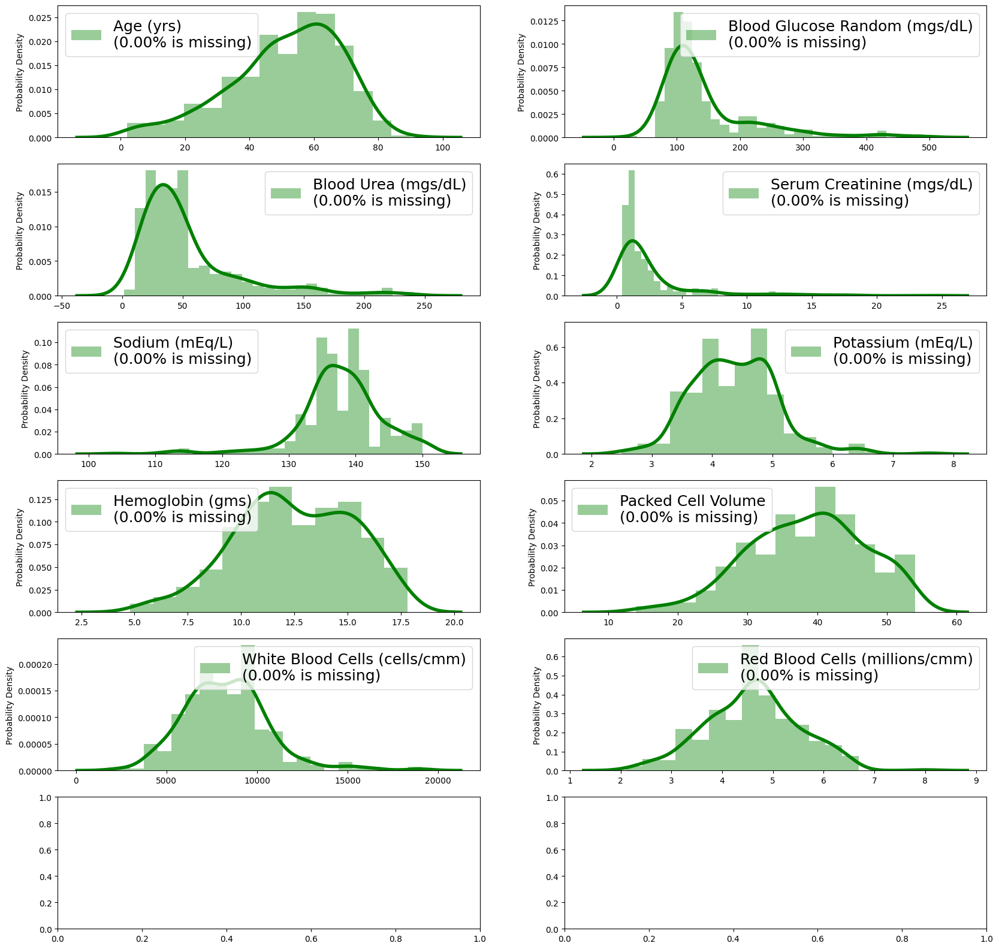

In [14]:
#一覽表視覺化，繪製 (7x2) 的圖表
#數值型欄位

#7x2的圖表
n_rows, n_cols = (6,2)

#每一張圖表大小為20x50
figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20, 20))

#走訪每一個數值型欄位
#陣列變為 index, column走訪方式，要透過enumerate
for index, column in enumerate(numeric):
    
    #index由0開始
    #例如: 5//2為2(商數)，5%2為1(餘數)
    i,j = (index // n_cols), (index % n_cols)
    
    #計算該欄位去除空值的數量除以該欄位總數量的百分比
    miss_perc="%.2f"%(100*(1-(data[column].dropna().shape[0])/data.shape[0]))
    
    #文字敘述該欄位遺缺值的百分比
    collabel=column+"\n({}% is missing)".format(miss_perc)
    
    #透過seaborn的distplot針對該欄位畫圖
    #需增加常態分佈的線條
    fig=sns.distplot(data[column], color="g", label=collabel, norm_hist=True,
    
    #指派圖形位置，KDE線條寬度為4
    ax=axes[i,j], kde_kws={"lw":4})
    
    #在圖片中顯示文字說明
    #顯示的位置由程式自行判斷 (loc為best)
    fig=fig.legend(loc='best', fontsize=18)
    
    #定義每張圖的y軸說明文字
    axes[i,j].set_ylabel("Probability Density",fontsize='medium')
    
    #定義每張圖x軸說明文字為無
    axes[i,j].set_xlabel(None)

plt.show()

# 準備開始進行 K-means

In [15]:
#準備資料
X=data.drop(["Red Blood Cells: normal","Pus Cells: normal","Pus Cell Clumps: present","Bacteria: present","Hypertension: yes","Diabetes Mellitus: yes","Coronary Artery Disease: yes","Appetite: poor","Pedal Edema: yes","Anemia: yes","Chronic Kidney Disease: yes",'Sugar','Blood Pressure (mm/Hg)','Albumin','Specific Gravity'],axis=1,inplace=False)

print("資料筆數:",len(X))
print("欄位數量:",len(X.columns))

資料筆數: 392
欄位數量: 10


In [16]:
#提供多種scale的方式

#StandardScaler是最常見的標準化函數
from sklearn.preprocessing import StandardScaler
SS=StandardScaler()

In [17]:
full_scaled_data=SS.fit_transform(X)
scaled_data=SS.fit_transform(full_scaled_data)

In [18]:
from sklearn.cluster import KMeans

C:\Users\user\miniconda3\envs\week_08\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\user\miniconda3\envs\week_08\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\user\miniconda3\envs\week_08\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\user\miniconda3\envs\week_08\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` wi

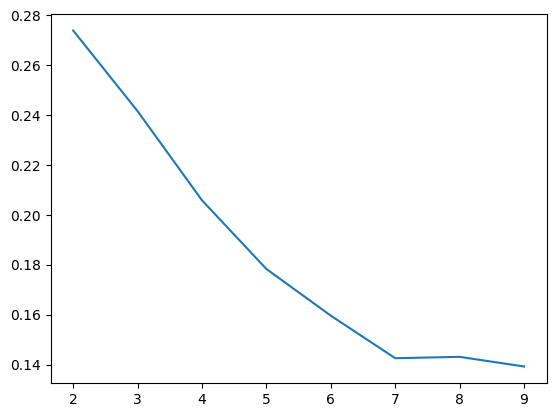

In [19]:
#透過輪廓係數(-1,1) 該值越大表示分群效果越好

from sklearn.metrics import silhouette_score

silhouette_avg = []

#由第2群找到第10群，觀察轉折點 (轉折點就是變化量最大的地方，不是看該值的大小)
for i in range(2,10):
    kmeans_fit = KMeans(n_clusters = i).fit(scaled_data)
    silhouette_avg.append(silhouette_score(scaled_data, kmeans_fit.labels_))
    
plt.plot(range(2,10), silhouette_avg)

# print("轉折點目前發現{}可以試試看作為K值".format(10))

In [28]:
#選擇分群數量(K值為4)
n_clusters = 7

#建立Kmeans演算法
kmean = KMeans(n_clusters=n_clusters)

kmean.fit(scaled_data);
print("kmean: k={}".format(n_clusters))

#取得分群結果 (每筆資料都會一個分群代碼，由0開始)
labels = kmean.labels_

#取得分群的中心點(質心)
centers = kmean.cluster_centers_

kmean: k=7


C:\Users\user\miniconda3\envs\week_08\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [29]:
#將分群結果寫入dataframe，有利於分群分析
data['group']=labels

In [30]:
#查看個群數量，由第0群開始排序
data['group'].value_counts().sort_index()

group
0    66
1    81
2    27
3    99
4    37
5    38
6    44
Name: count, dtype: int64

In [31]:
#質心
print(centers.shape)

#將質心存起來，下次Re-fresh的時候還可以用
from numpy import savetxt, loadtxt
savetxt('ckd_centers.csv', centers, delimiter=',')

#讀取質心的檔案
load_centers = loadtxt('ckd_centers.csv', delimiter=',')

#再次執行kmeans程式
kmean_test_centers = KMeans(n_clusters=n_clusters,init=load_centers)
kmean_test_centers.fit(scaled_data)
labels_test_centers = kmean_test_centers.labels_

#將分群結果寫入dataframe，有利於分群分析
data['group_test_centers']=labels_test_centers

(7, 10)


C:\Users\user\miniconda3\envs\week_08\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\user\miniconda3\envs\week_08\lib\site-packages\sklearn\cluster\_kmeans.py:1416: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  super()._check_params_vs_input(X, default_n_init=10)


# 繪圖

## k = 7

C:\Users\user\miniconda3\envs\week_08\lib\site-packages\seaborn\axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


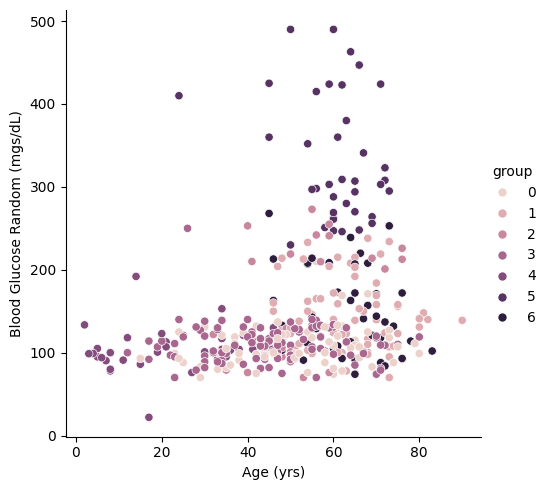

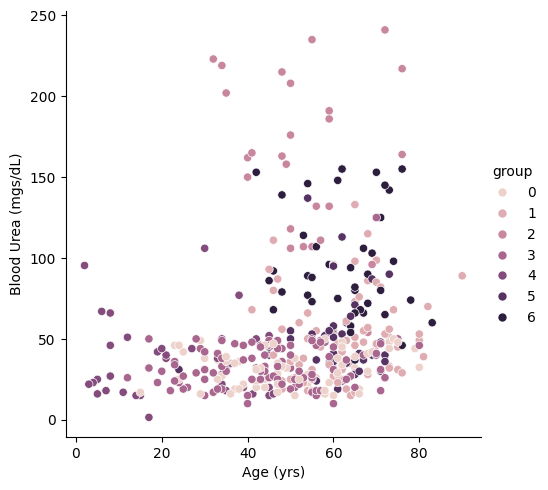

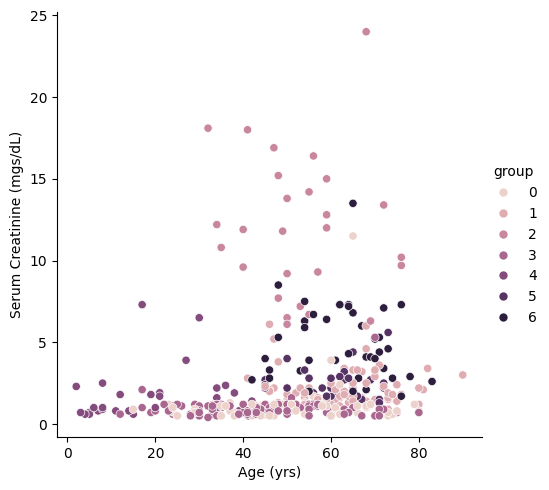

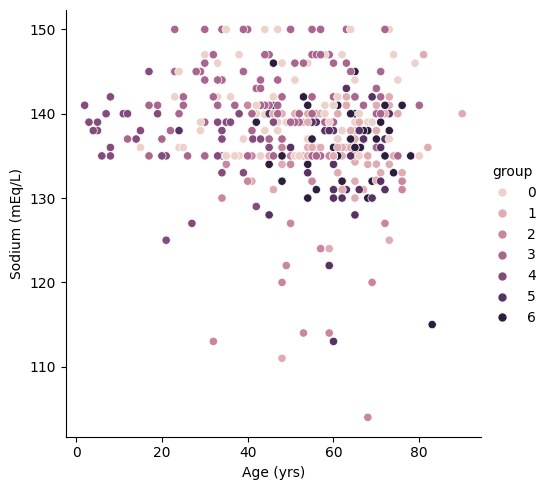

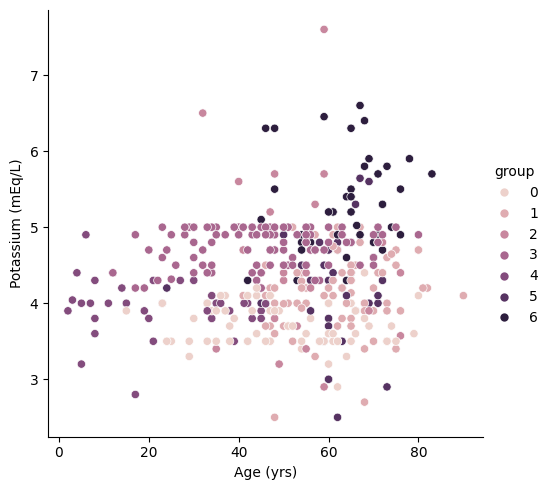

...

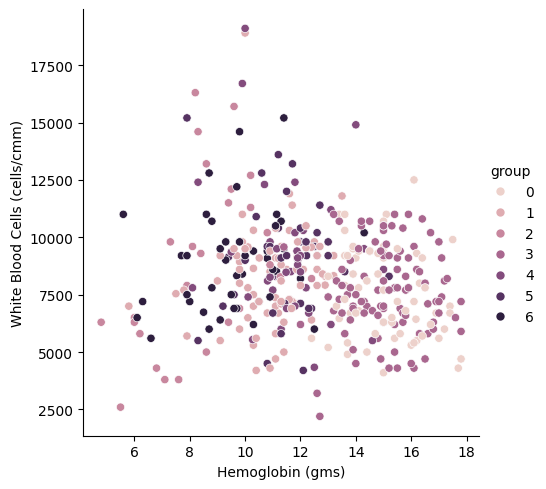

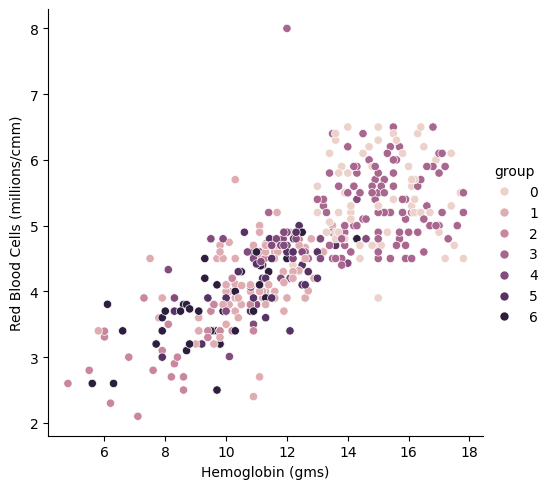

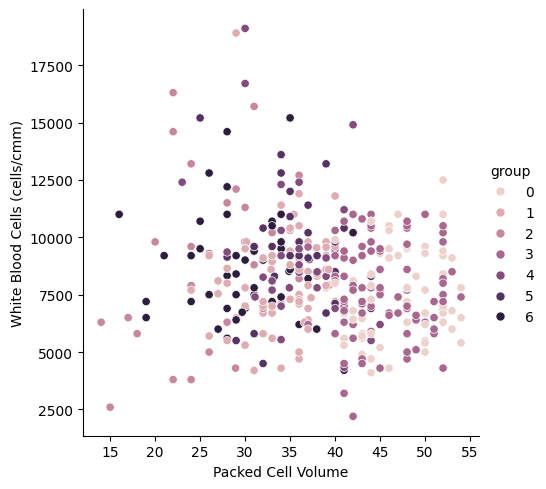

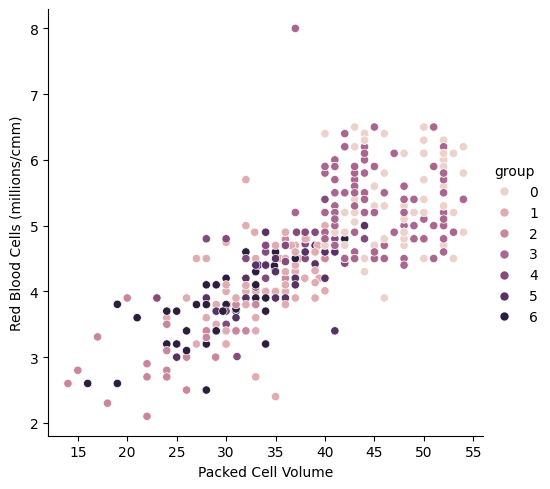

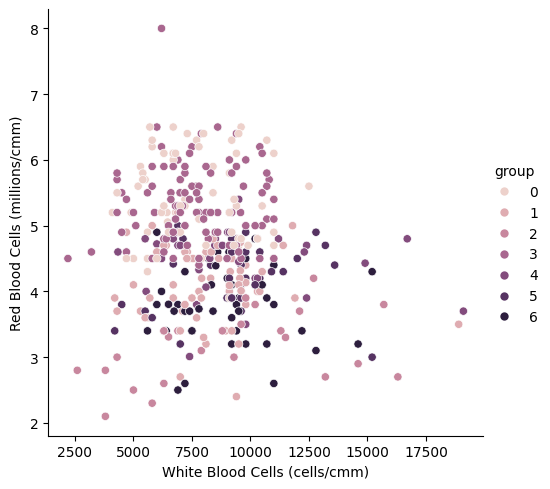

In [32]:
import seaborn as sns
#用散佈圖方式顯示資料
# for index, column in enumerate(numeric):
for index, column in enumerate(numeric):
    for i in range(index+1,len(numeric)):
        sns.relplot(x=data[column], y=data[numeric[i]],data=data,hue="group")

## k = 4

C:\Users\user\miniconda3\envs\week_08\lib\site-packages\seaborn\axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


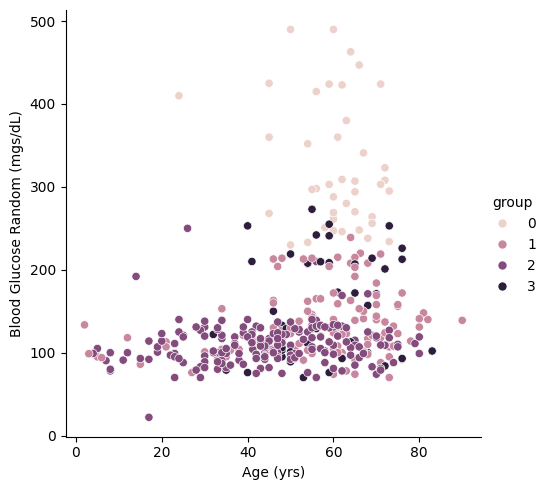

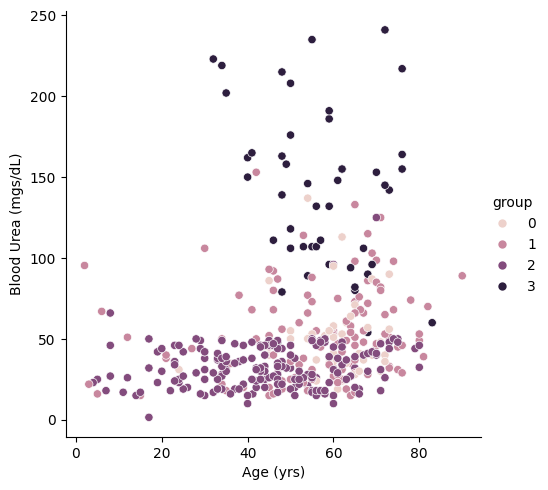

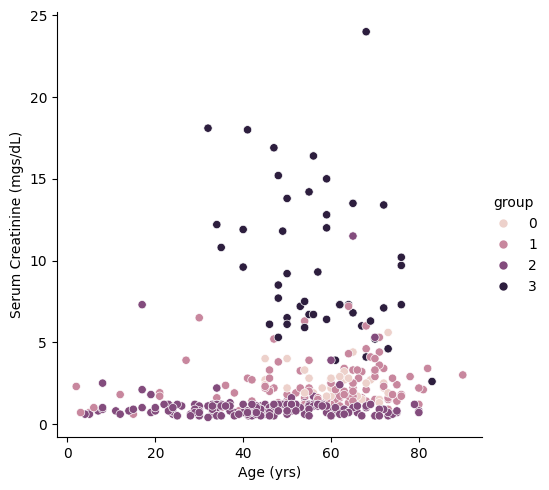

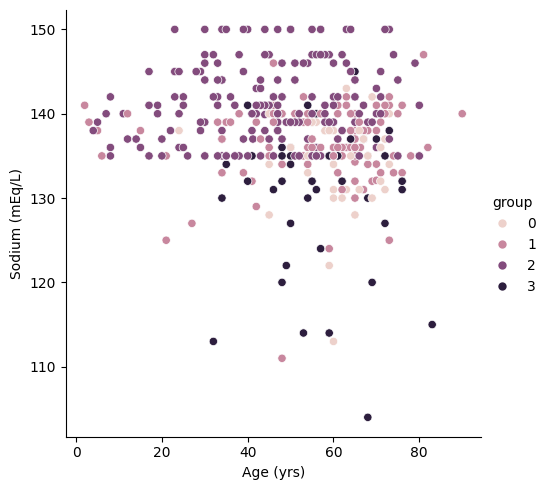

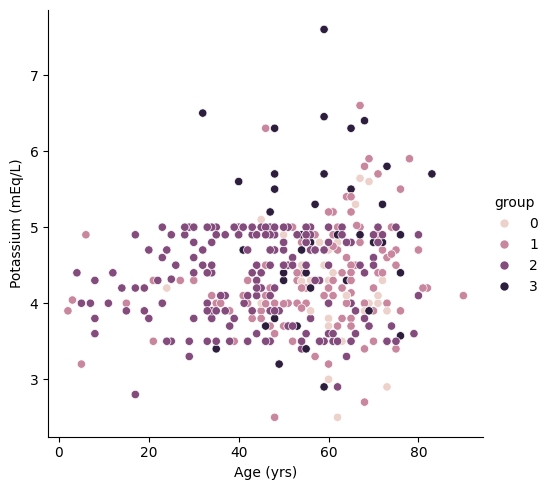

...

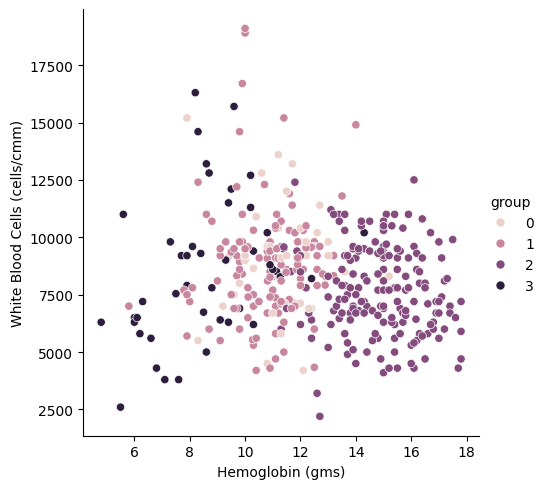

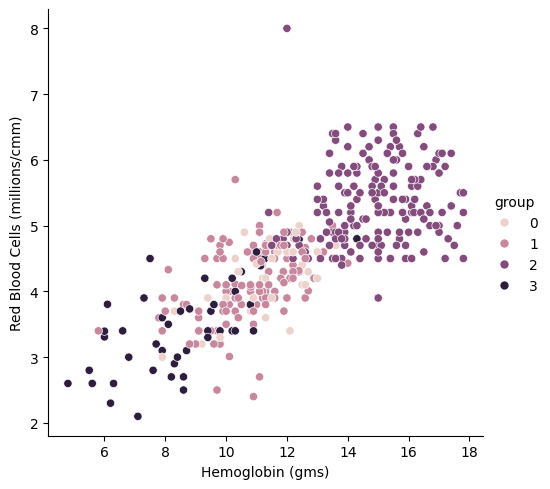

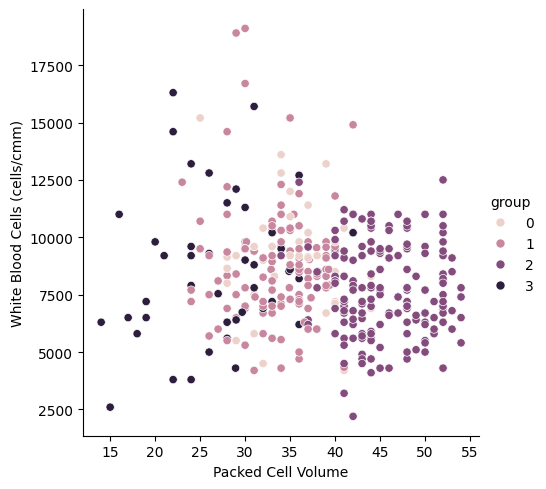

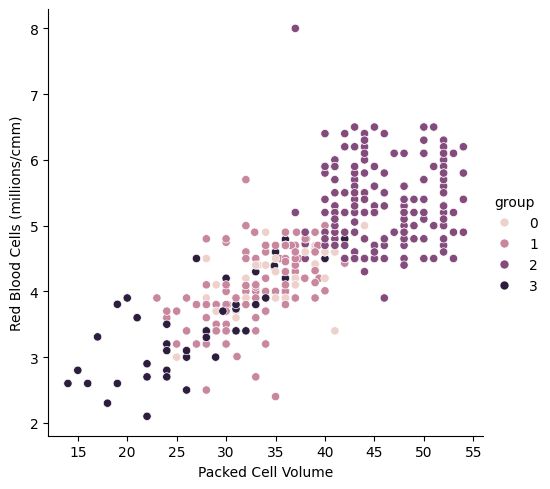

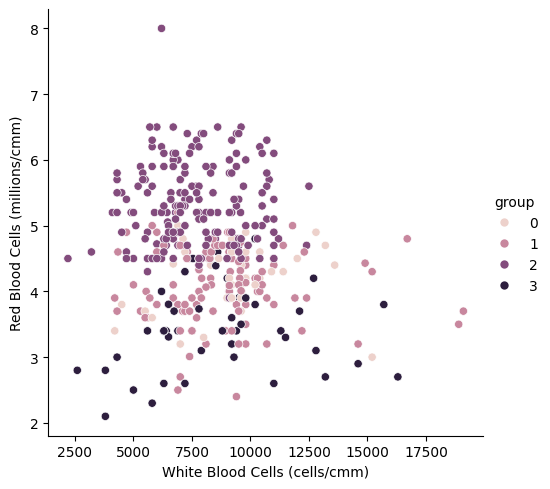

In [24]:
import seaborn as sns
#用散佈圖方式顯示資料
# for index, column in enumerate(numeric):
for index, column in enumerate(numeric):
    for i in range(index+1,len(numeric)):
        sns.relplot(x=data[column], y=data[numeric[i]],data=data,hue="group")

C:\Users\user\miniconda3\envs\week_08\lib\site-packages\seaborn\axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


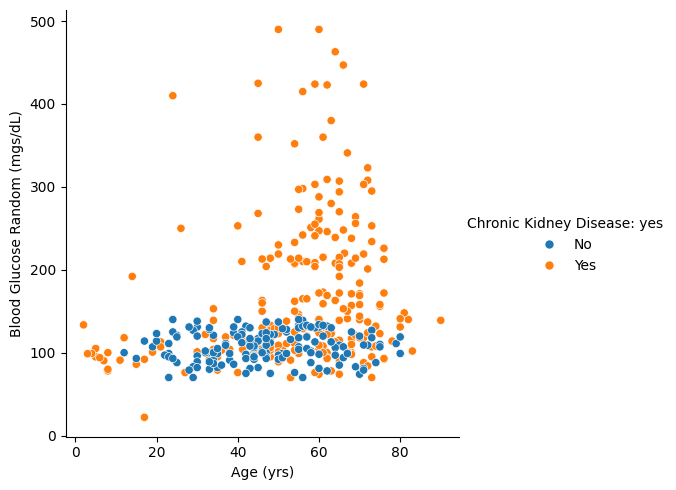

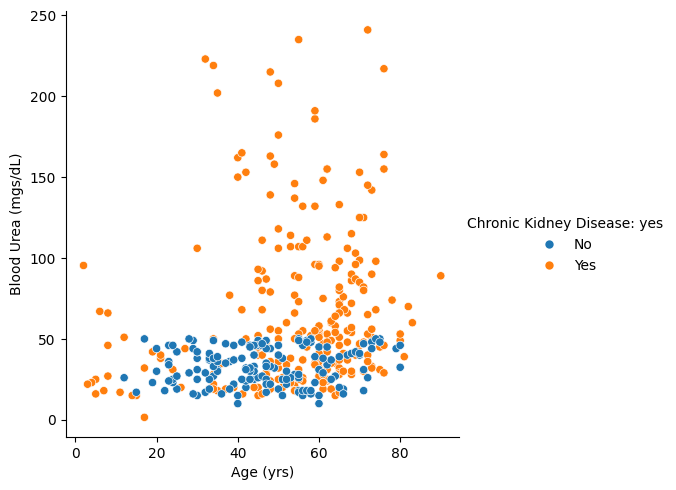

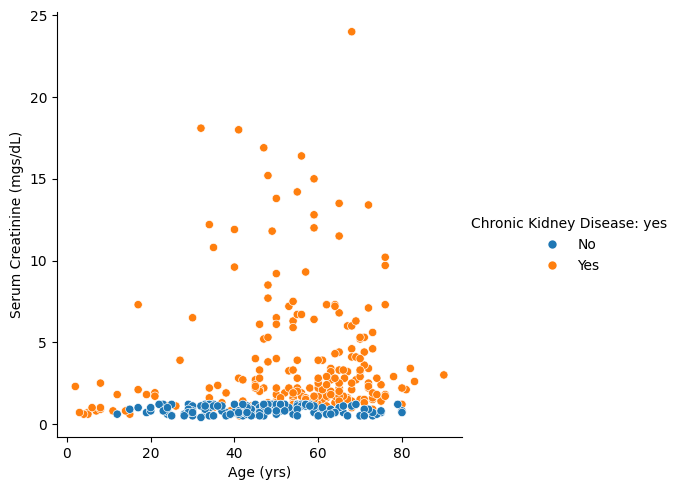

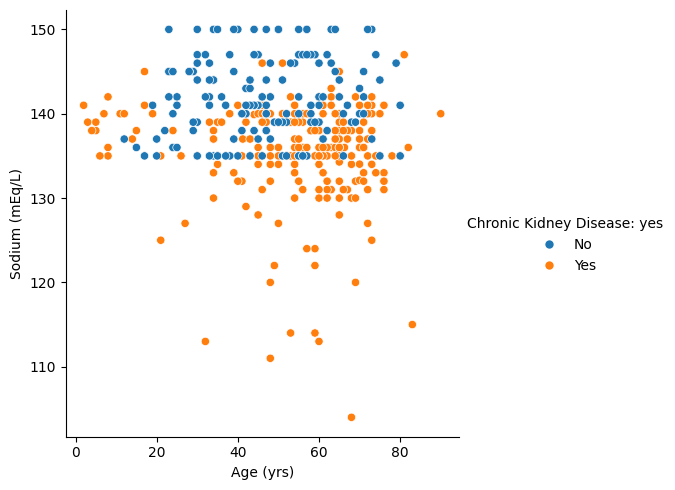

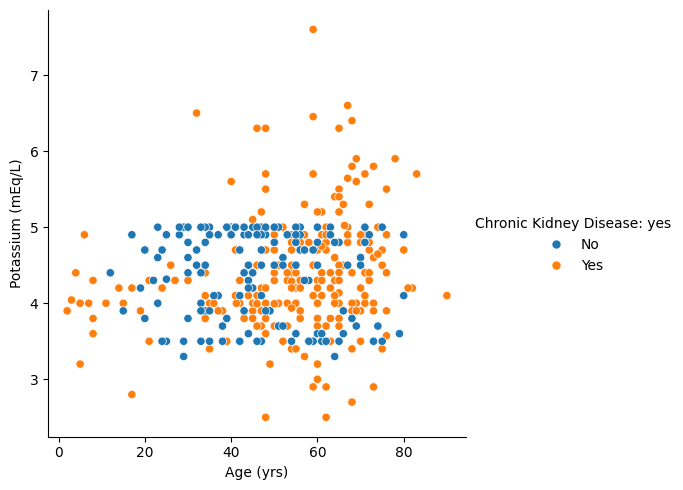

...

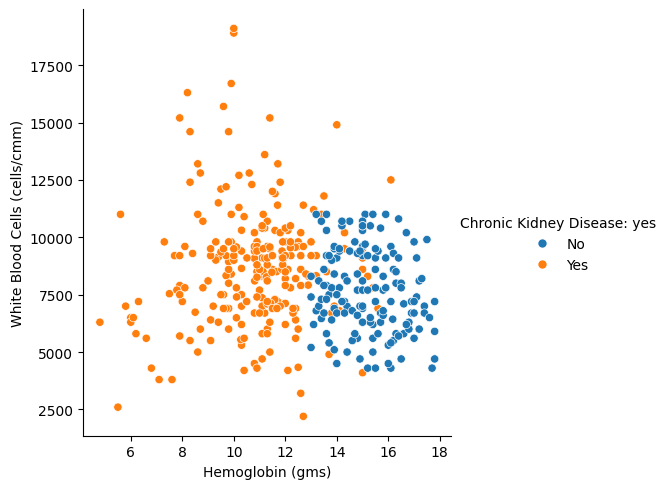

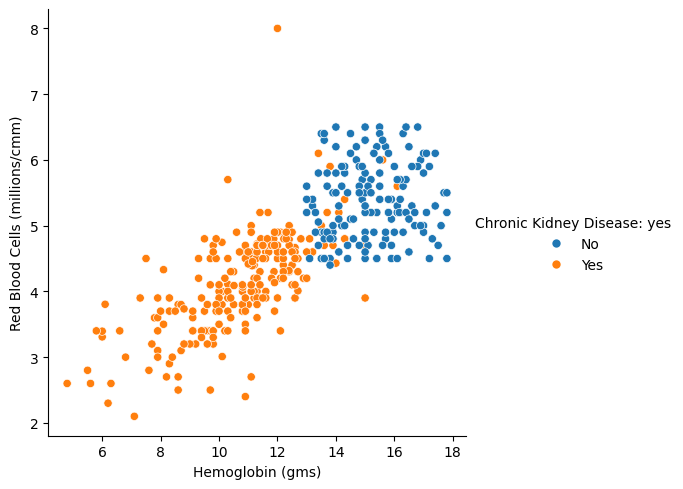

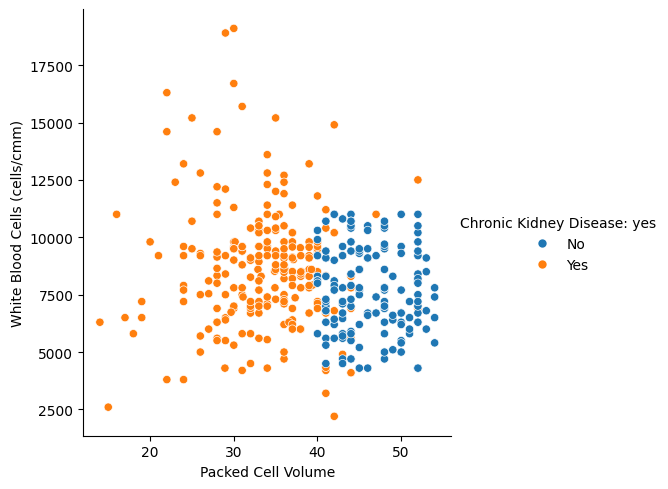

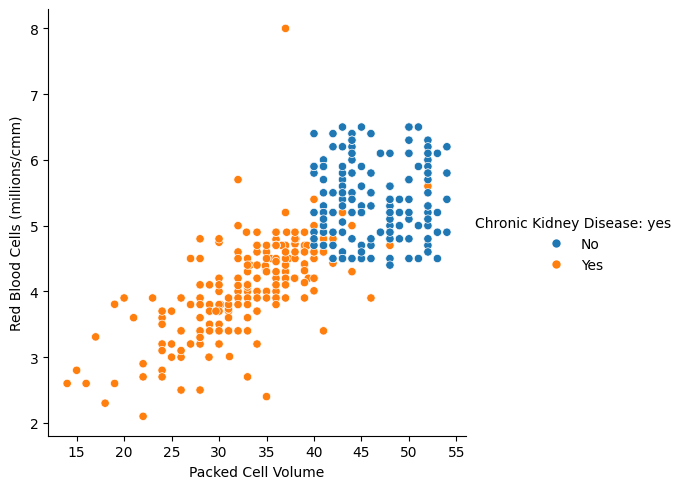

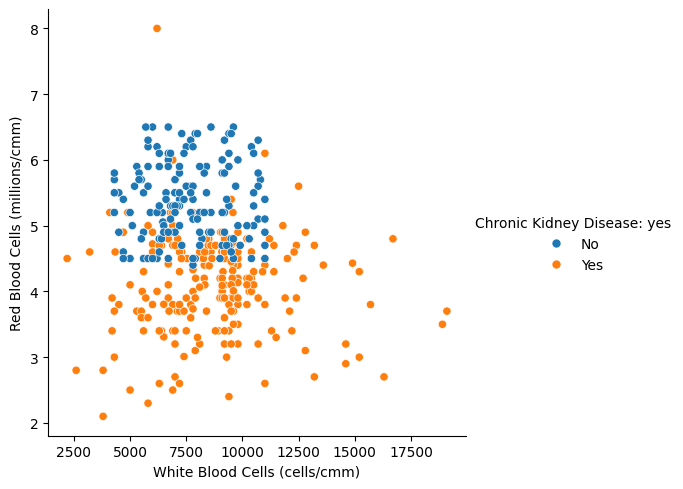

In [25]:
import seaborn as sns
#用散佈圖方式顯示資料
# for index, column in enumerate(numeric):
for index, column in enumerate(numeric):
    for i in range(index+1,len(numeric)):
        sns.relplot(x=data[column], y=data[numeric[i]],data=data,hue="Chronic Kidney Disease: yes")

In [26]:
len(numeric)

10

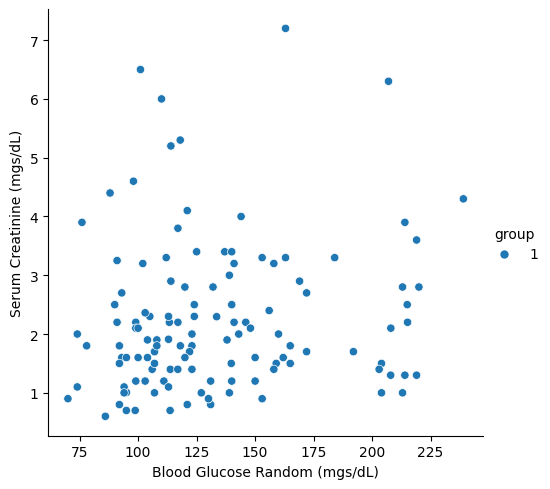

In [27]:
tmp = data[data['group']==1]
sns.relplot(x=tmp['Blood Glucose Random (mgs/dL)'], y=tmp['Serum Creatinine (mgs/dL)'],data=tmp,hue="group")